# Download Dataset

In [4]:
 !pip install -q kaggle

In [5]:
!mkdir /root/.kaggle
!cp /content/kaggle.json /root/.kaggle
!kaggle competitions download -c house-prices-advanced-regression-techniques

mkdir: cannot create directory ‘/root/.kaggle’: File exists
data_description.txt: Skipping, found more recently modified local copy (use --force to force download)
train.csv: Skipping, found more recently modified local copy (use --force to force download)
test.csv: Skipping, found more recently modified local copy (use --force to force download)
sample_submission.csv: Skipping, found more recently modified local copy (use --force to force download)


# Imports

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
from scipy import stats
from scipy.stats import norm, skew
from sklearn.preprocessing import LabelEncoder
from tqdm.auto import tqdm

# Ignore unusful warning (from sklearn and seaborn)
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn

# Changing color of grid plots
color = sns.color_palette()
sns.set_style('darkgrid')

pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) # Limiting floats output to 3 decimal points
%matplotlib inline

# Determine the device

In [7]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
!nvidia-smi

cuda:0
Thu Dec 10 12:57:23 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P8    11W /  70W |     10MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+

# Consts

In [8]:
NUM_FEATURES = 79
BATCH_SIZE = 32

# Showing Dataset

In [9]:
train = pd.read_csv('./train.csv')
test = pd.read_csv('./test.csv')

In [10]:
train.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,...,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,...,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,...,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,...,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,...,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,...,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [11]:
test.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.000,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.000,TA,TA,CBlock,TA,TA,No,Rec,468.000,LwQ,144.000,270.000,882.000,GasA,TA,Y,SBrkr,896,0,0,896,0.000,0.000,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.000,Unf,1.000,730.000,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.000,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.000,TA,TA,CBlock,TA,TA,No,ALQ,923.000,Unf,0.000,406.000,1329.000,GasA,TA,Y,SBrkr,1329,0,0,1329,0.000,0.000,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.000,Unf,1.000,312.000,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.000,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.000,TA,TA,PConc,Gd,TA,No,GLQ,791.000,Unf,0.000,137.000,928.000,GasA,Gd,Y,SBrkr,928,701,0,1629,0.000,0.000,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.000,Fin,2.000,482.000,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.000,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.000,TA,TA,PConc,TA,TA,No,GLQ,602.000,Unf,0.000,324.000,926.000,GasA,Ex,Y,SBrkr,926,678,0,1604,0.000,0.000,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.000,Fin,2.000,470.000,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.000,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.000,Gd,TA,PConc,Gd,TA,No,ALQ,263.000,Unf,0.000,1017.000,1280.000,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.000,0.000,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.000,RFn,2.000,506.000,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [12]:
# Print the numbers of samples and features
print("The train data size before dropping Id feature is : {} ".format(train.shape))
print("The test data size before dropping Id feature is : {} ".format(test.shape))

# Save the 'Id' column
train_ID = train['Id']
test_ID = test['Id']

# Drop the 'Id' column since it's unnecessary for the prediction process.
train.drop("Id", axis = 1, inplace = True)
test.drop("Id", axis = 1, inplace = True)

# Check again the data size after dropping the 'Id' column
print("\nThe train data size after dropping Id feature is : {} ".format(train.shape)) 
print("The test data size after dropping Id feature is : {} ".format(test.shape))

The train data size before dropping Id feature is : (1460, 81) 
The test data size before dropping Id feature is : (1459, 80) 

The train data size after dropping Id feature is : (1460, 80) 
The test data size after dropping Id feature is : (1459, 79) 


# Data Processing

Plotting wrapper class for statistics and visualization

In [13]:
class Plot(object):
    def __init__(self, nrows=20, ncols=4, figsize=(35,200), fontsize=30):
        self.nrows = nrows
        self.ncols = ncols
        self.figsize = figsize
        self.fontsize=fontsize


    def plot_grid(self, data, target_key, from_key, to_key):
        """
        Given a dataset, plots data feature distributions, corresponding to the 
        target starting from the specified key to the deserved one
        """
        
        assert to_key > from_key and to_key <= len(data.keys()), 'Invalid arguments!'

        plt.figure()
        fig, axes = plt.subplots(nrows=self.nrows, ncols=self.ncols, figsize=self.figsize)
        keys = data.keys()[from_key:to_key+1]

        for x in range(axes.shape[0]):
            for y in range(axes.shape[1]):
                if x*self.ncols+y < len(keys) and x*self.ncols+y <= to_key:
                    axes[x][y].set_ylabel(target_key, fontsize=self.fontsize)
                    axes[x][y].set_xlabel(keys[x*self.ncols+y], fontsize=self.fontsize)
                    notnan_filter = data[keys[x*self.ncols+y]].notna()

                    if not isinstance(data[keys[x*self.ncols+y]][0], str): # Numerical feature
                        axes[x][y].scatter(x=data.loc[notnan_filter, keys[x*self.ncols+y]], y=data.loc[notnan_filter, target_key])
                    else: # Categorical feature --> numerical conversion for plotting purposes
                        axes[x][y].scatter(x=data.loc[notnan_filter, keys[x*self.ncols+y]].astype('category').cat.codes, y=data.loc[notnan_filter, target_key])
                    plt.grid(True)

        plt.show()


    def plot_norm_dists(self, data, from_key, to_key):
        """
        Given a dataset, plots the data feature normal distributions
        """

        assert to_key > from_key and to_key <= len(data.keys()), 'Invalid arguments!'

        plt.figure()
        fig, axes = plt.subplots(nrows=self.nrows, ncols=self.ncols, figsize=self.figsize)
        keys = data.keys()[from_key:to_key+1]

        for x in range(axes.shape[0]):
            for y in range(axes.shape[1]):
                if x*self.ncols+y < len(keys) and x*self.ncols+y <= to_key:
                    current = data[keys[x*self.ncols+y]]
                    notnan_filter = current.notna()
                    notnan = data.loc[notnan_filter, keys[x*self.ncols+y]]

                    notnanzero = None
                    if not isinstance(notnan.tolist()[0], str): # Numerical feature
                        notnanzero_filter = current.where(current > 0).notna()
                        notnanzero = data.loc[notnanzero_filter, keys[x*self.ncols+y]]
                    else: # Categorical feature --> numerical conversion for plotting purposes
                        notnanzero = notnan.astype('category').cat.codes + 1 # Starting from class no' 1

                    # Plot the distribution
                    sns.distplot(notnanzero, fit=norm, ax=axes[x][y])

                    # Get the fitted parameters used by the function
                    (mu, sigma) = norm.fit(notnanzero)

                    # Some plot features
                    axes[x][y].legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
                                loc='best')
                    axes[x][y].set_ylabel('Frequency', fontsize=self.fontsize)
                    axes[x][y].set_xlabel(f'{keys[x*self.ncols+y]} distribution', fontsize=self.fontsize)
                    plt.grid(True)
                    
        plt.show()


    def plot_qq(self, data, from_key, to_key):
        """
        Given a dataset, plots the data feature QQ graphs
        """

        assert to_key > from_key and to_key <= len(data.keys()), 'Invalid arguments!'

        plt.figure()
        fig, axes = plt.subplots(nrows=self.nrows, ncols=self.ncols, figsize=self.figsize)
        keys = data.keys()[from_key:to_key+1]

        for x in range(axes.shape[0]):
            for y in range(axes.shape[1]):
                if x*self.ncols+y < len(keys) and x*self.ncols+y <= to_key:
                    current = data[keys[x*self.ncols+y]]
                    notnan_filter = current.notna()
                    notnan = data.loc[notnan_filter, keys[x*self.ncols+y]]

                    notnanzero = None
                    if not isinstance(notnan.tolist()[0], str): # Numerical feature
                        notnanzero_filter = current.where(current > 0).notna()
                        notnanzero = data.loc[notnanzero_filter, keys[x*self.ncols+y]]
                    else: # Categorical feature --> numerical conversion for plotting purposes
                        notnanzero = notnan.astype('category').cat.codes + 1 # Starting from class no' 1
 
                    # Plot the QQ graph
                    # plt.rcParams['axes.titlesize'] = self.fontsize
                    stats.probplot(notnanzero, plot=axes[x][y])
                    axes[x][y].xaxis.get_label().set_fontsize(self.fontsize)
                    axes[x][y].yaxis.get_label().set_fontsize(self.fontsize)
                    # axes[x][y].set_title(keys[x*self.ncols+y])
                    plt.grid(True)
        
        plt.show()

In [14]:
plot_wrapper = Plot()

According to the contest documentation, there are some outliers within the data that are needed to be taken care of

<Figure size 432x288 with 0 Axes>

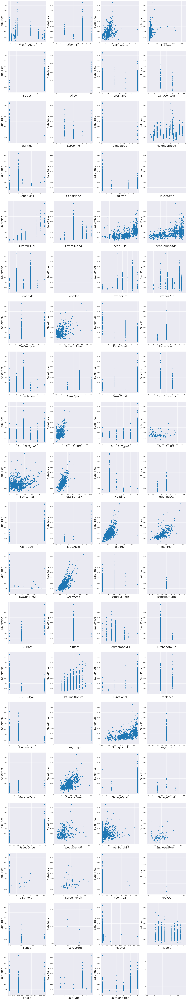

In [15]:
# Draw grid with outliers
plot_wrapper.plot_grid(train, 'SalePrice', 0, NUM_FEATURES-1)

In [16]:
# Delete outliers according to the grid above

train = train.drop(train[train['LotFrontage']>300].index)
train = train.drop(train[train['LotArea']>200000].index)
train = train.drop(train[(train['MasVnrArea']>1500) | (train['SalePrice']>700000)].index)
train = train.drop(train[train['BsmtFinSF1']>5000].index)
train = train.drop(train[(train['BsmtFinSF2']>1400) & (train['SalePrice']<300000)].index)
train = train.drop(train[train['TotalBsmtSF']>6000].index)
train = train.drop(train[train['1stFlrSF']>4000].index)
train = train.drop(train[(train['GrLivArea']>4000) & (train['SalePrice']<300000)].index)
train = train.drop(train[(train['LowQualFinSF']>500) & (train['SalePrice']>400000)].index)
train = train.drop(train[train['EnclosedPorch']>500].index)
train = train.drop(train[train['MiscVal']>14000].index)

<Figure size 432x288 with 0 Axes>

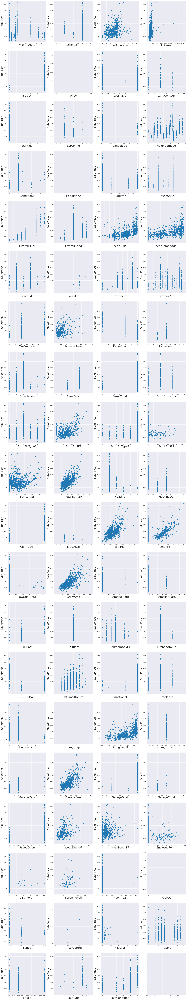

In [17]:
# Draw grid without outliers
plot_wrapper.plot_grid(train, 'SalePrice', 0, NUM_FEATURES-1)

# Target Variable Analysis

Normality test for each feature is to confirm whether it is
well-modeled by a normal distribution and to explore
possible transformation to a normal distribution

In [18]:
def apply_log(data, keys):
    """
    Given a dataset (dataframe) and an array of keys, applies log(1+x) 
    to all elements under each key column and returns the new dataframe
    """
    
    new_data = data.copy()

    for i, k in enumerate(keys):
        # (1+x) adds a bit noise to the data in order to immune some math problems as log(0)
        new_data[k] = np.log1p(data[k])

    return new_data

Before log transformation

<Figure size 432x288 with 0 Axes>

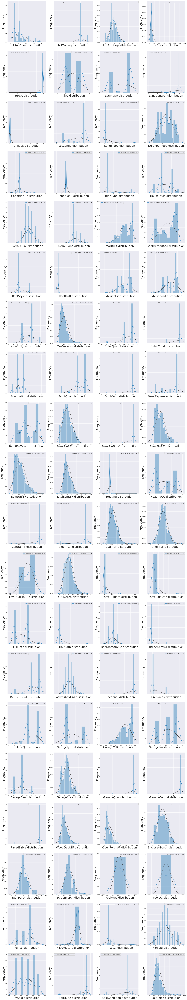

In [19]:
# Plot the feature and the target normal distributions
plot_wrapper.plot_norm_dists(train, 0, NUM_FEATURES+1) # +1 --> including the target SalePrice

<Figure size 432x288 with 0 Axes>

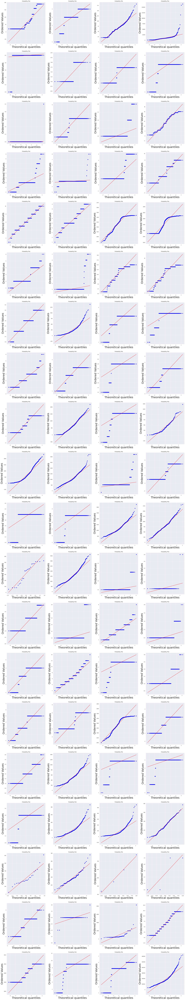

In [20]:
# Plot the feature and the target normal QQ graphs
plot_wrapper.plot_qq(train, 0, NUM_FEATURES+1) # +1 --> including the target SalePrice

In [21]:
# The relevant keys according to the graphs above
keys = ['BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea',
        'WoodDeckSF', 'OpenPorchSF', 'SalePrice', '3SsnPorch',
        'MasVnrArea', 'GarageArea', 'WoodDeckSF', 'ScreenPorch', 'BsmtFinSF2']

After applying log function


In [22]:
train = apply_log(train, keys)
train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.283,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0.000,5.017,6.753,GasA,Ex,Y,SBrkr,6.753,854,0,7.445,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2,6.308,TA,TA,Y,0.000,4.127,0,0.000,0.000,0,NaN,NaN,NaN,0,2,2008,WD,Normal,12.248
1,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0.000,5.652,7.141,GasA,Ex,Y,SBrkr,7.141,0,0,7.141,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2,6.133,TA,TA,Y,5.700,0.000,0,0.000,0.000,0,NaN,NaN,NaN,0,5,2007,WD,Normal,12.109
2,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.094,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0.000,6.075,6.825,GasA,Ex,Y,SBrkr,6.825,866,0,7.488,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2,6.412,TA,TA,Y,0.000,3.761,0,0.000,0.000,0,NaN,NaN,NaN,0,9,2008,WD,Normal,12.317
3,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0.000,6.293,6.629,GasA,Gd,Y,SBrkr,6.869,756,0,7.449,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3,6.466,TA,TA,Y,0.000,3.584,272,0.000,0.000,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,11.849
4,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.861,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0.000,6.196,7.044,GasA,Ex,Y,SBrkr,7.044,1053,0,7.696,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3,6.730,TA,TA,Y,5.263,4.443,0,0.000,0.000,0,NaN,NaN,NaN,0,12,2008,WD,Normal,12.429


<Figure size 432x288 with 0 Axes>

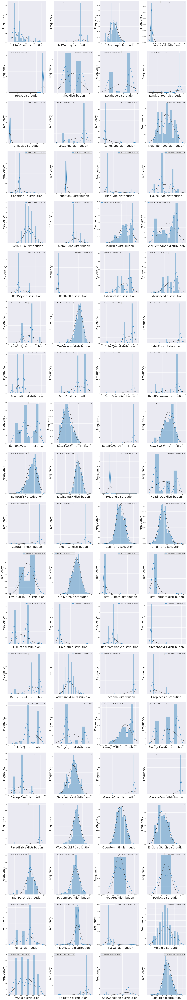

In [23]:
plot_wrapper.plot_norm_dists(train, 0, NUM_FEATURES+1) # +1 for the target SalePrice

<Figure size 432x288 with 0 Axes>

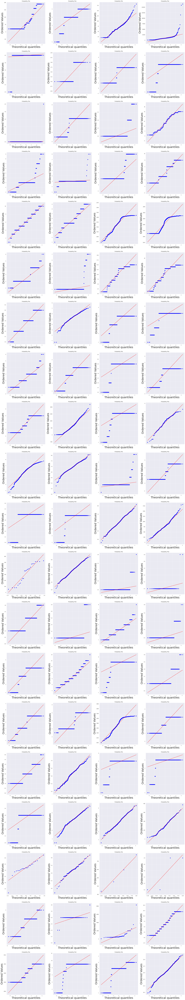

In [24]:
# Plot the feature and the target normal QQ graphs
plot_wrapper.plot_qq(train, 0, NUM_FEATURES+1) # +1 for the target SalePrice

# Feature Engineering

Fix missing values and supplement the deserved ones

In [25]:
# First, concatinate the train and test sets to apply preprocessing on both

ntrain = train.shape[0]
ntest = test.shape[0]
y_train = train.SalePrice.values
all_data = pd.concat((train, test)).reset_index(drop=True)
all_data.drop(['SalePrice'], axis=1, inplace=True)
print("all_data size is : {}".format(all_data.shape))

all_data size is : (2909, 79)


In [26]:
all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:30]
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data.head(20)

,Missing Ratio
PoolQC,99.759
MiscFeature,96.425
Alley,93.228
Fence,80.474
FireplaceQu,48.780
LotFrontage,16.672
GarageFinish,5.466
GarageYrBlt,5.466
GarageQual,5.466
GarageCond,5.466


Text(0.5, 1.0, 'Percent missing data by feature')

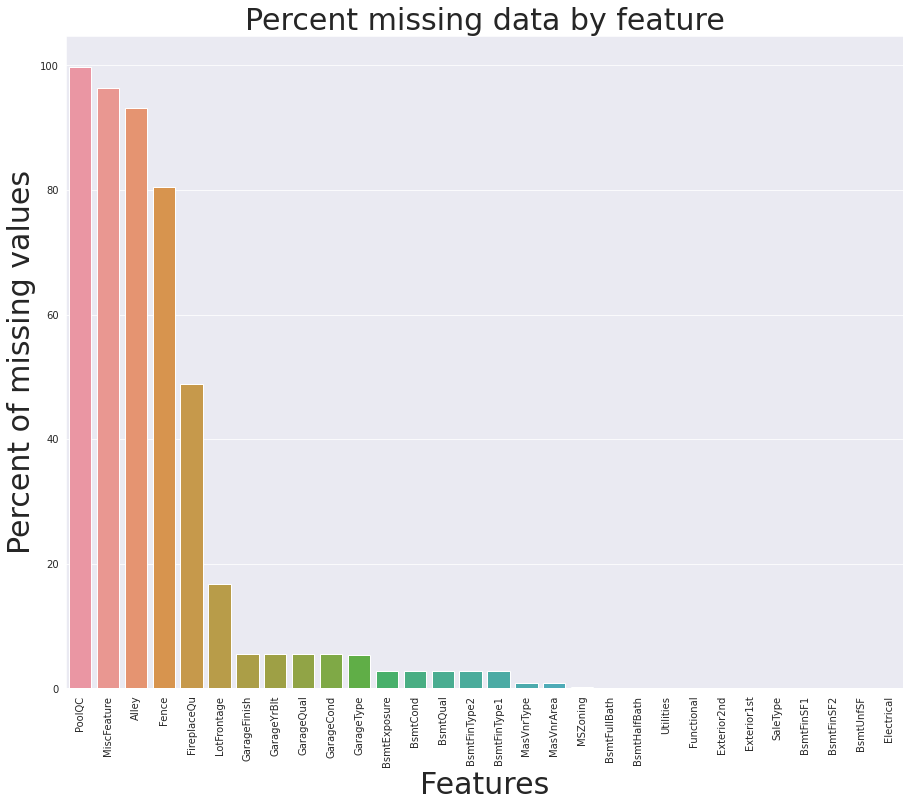

In [27]:
f, ax = plt.subplots(figsize=(15, 12))
plt.xticks(rotation='90')
sns.barplot(x=all_data_na.index, y=all_data_na)
plt.xlabel('Features', fontsize=30)
plt.ylabel('Percent of missing values', fontsize=30)
plt.title('Percent missing data by feature', fontsize=30)

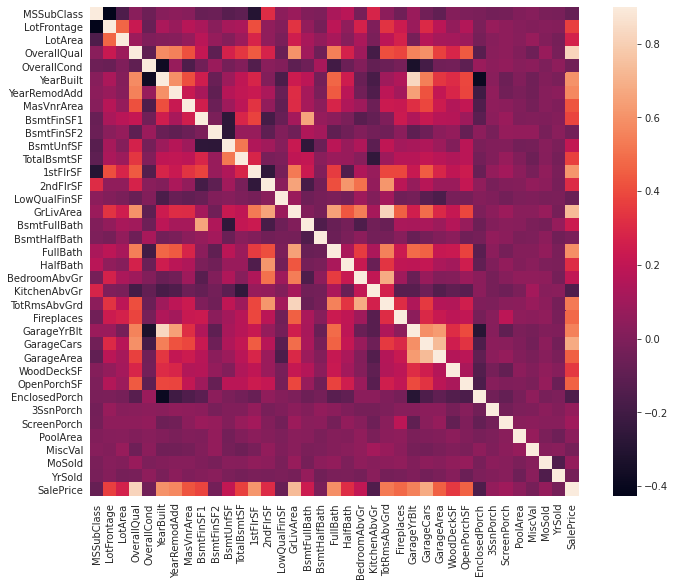

In [28]:
# Correlation map to see how features are correlated with the target SalePrice

corrmat = train.corr()
plt.subplots(figsize=(12,9))
sns.heatmap(corrmat, vmax=0.9, square=True)

Fill uncommon values with None value, according to the missing values graph above

In [29]:
# Missing value = None = no swimming pool
all_data["PoolQC"] = all_data["PoolQC"].fillna("None")

In [30]:
# Missing value = None = no miscellaneous features
all_data["MiscFeature"] = all_data["MiscFeature"].fillna("None")

In [31]:
# Missing value = None = no alley access
all_data["Alley"] = all_data["Alley"].fillna("None")

In [32]:
# Missing value = None = no fence
all_data["Fence"] = all_data["Fence"].fillna("None")

In [33]:
# Missing value = None = no fireplace
all_data["FireplaceQu"] = all_data["FireplaceQu"].fillna("None")

In [34]:
# Missing value = None = no building type
all_data['MSSubClass'] = all_data['MSSubClass'].fillna("None")

Fill LotFrontage missing values with the median LotFrontage of the neighborhood, since the area of each street connected to the house most likely has a similar area to other houses in its neighborhood

In [35]:
# Group by neighborhood and fill in missing value by the median LotFrontage of all the neighborhood
all_data["LotFrontage"] = all_data.groupby("Neighborhood")["LotFrontage"].transform(
    lambda x: x.fillna(x.median()))

In [36]:
# Missing value = None = no garage
for col in ('GarageType', 'GarageFinish', 'GarageQual', 'GarageCond'):
    all_data[col] = all_data[col].fillna('None')

# No garage means zero cars in such garage
for col in ('GarageYrBlt', 'GarageArea', 'GarageCars'):
    all_data[col] = all_data[col].fillna(0)

In [37]:
# Missing value = no (zero) basements
for col in ('BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF','TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath'):
    all_data[col] = all_data[col].fillna(0)

for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    all_data[col] = all_data[col].fillna('None')

In [38]:
# No masonry veneer = None veneer type and zero veneer area 
all_data["MasVnrType"] = all_data["MasVnrType"].fillna("None")
all_data["MasVnrArea"] = all_data["MasVnrArea"].fillna(0)

Fill missing value with the most common value 'RL' (Residential Low Density)

In [39]:
# This is the zone type of the house
all_data['MSZoning'] = all_data['MSZoning'].fillna(all_data['MSZoning'].mode()[0])

For this categorical feature all records are "AllPub", except for one "NoSeWa" and 2 NA. Since the house with 'NoSeWa' is in the training set, this feature won't help in predictive modelling. It is better to safely drop this column.

In [40]:
all_data = all_data.drop(['Utilities'], axis=1)

Fill missing value with the most common value 'Typ' (Typical house functionality)

In [41]:
all_data["Functional"] = all_data["Functional"].fillna("Typ")

Since 'Electrical' has only one missing value and most of the values are 'SBrkr', we can set that for the missing value.

In [42]:
all_data['Electrical'] = all_data['Electrical'].fillna(all_data['Electrical'].mode()[0])

Same as 'Electrical', 'KitchenQual' has only one NA value. Set this with 'TA' (the most frequent value)

In [43]:
all_data['KitchenQual'] = all_data['KitchenQual'].fillna(all_data['KitchenQual'].mode()[0])

Again, fill single missing value with the common one

In [44]:
all_data['Exterior1st'] = all_data['Exterior1st'].fillna(all_data['Exterior1st'].mode()[0])
all_data['Exterior2nd'] = all_data['Exterior2nd'].fillna(all_data['Exterior2nd'].mode()[0])

all_data['SaleType'] = all_data['SaleType'].fillna(all_data['SaleType'].mode()[0])

In [45]:
# Validate that there is no remaining missing value

all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data.head()

,Missing Ratio


Transform some numerical variables that are more likely to be categorical features

In [46]:
# MSSubClass=The building class
all_data['MSSubClass'] = all_data['MSSubClass'].apply(str)

# Changing OverallCond into a categorical variable
all_data['OverallCond'] = all_data['OverallCond'].astype(str)

# Year and month sold are transformed into categorical features.
all_data['YrSold'] = all_data['YrSold'].astype(str)
all_data['MoSold'] = all_data['MoSold'].astype(str)

In [47]:
all_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.000,8450,Pave,None,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.283,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,5.017,6.753,GasA,Ex,Y,SBrkr,6.753,854,0,7.445,1.000,0.000,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.000,RFn,2.000,6.308,TA,TA,Y,0.000,4.127,0,0.000,0.000,0,None,None,None,0,2,2008,WD,Normal
1,20,RL,80.000,9600,Pave,None,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,5.652,7.141,GasA,Ex,Y,SBrkr,7.141,0,0,7.141,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,6.133,TA,TA,Y,5.700,0.000,0,0.000,0.000,0,None,None,None,0,5,2007,WD,Normal
2,60,RL,68.000,11250,Pave,None,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.094,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,6.075,6.825,GasA,Ex,Y,SBrkr,6.825,866,0,7.488,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,6.412,TA,TA,Y,0.000,3.761,0,0.000,0.000,0,None,None,None,0,9,2008,WD,Normal
3,70,RL,60.000,9550,Pave,None,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,6.293,6.629,GasA,Gd,Y,SBrkr,6.869,756,0,7.449,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,6.466,TA,TA,Y,0.000,3.584,272,0.000,0.000,0,None,None,None,0,2,2006,WD,Abnorml
4,60,RL,84.000,14260,Pave,None,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.861,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,6.196,7.044,GasA,Ex,Y,SBrkr,7.044,1053,0,7.696,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,6.730,TA,TA,Y,5.263,4.443,0,0.000,0.000,0,None,None,None,0,12,2008,WD,Normal


In [48]:
cols = ['FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond', 
        'ExterQual', 'ExterCond','HeatingQC', 'PoolQC', 'KitchenQual', 'BsmtFinType1', 
        'BsmtFinType2', 'Functional', 'Fence', 'BsmtExposure', 'GarageFinish', 'LandSlope',
        'LotShape', 'PavedDrive', 'Street', 'Alley', 'CentralAir', 'MSSubClass', 'OverallCond', 
        'YrSold', 'MoSold']

# Process columns, apply LabelEncoder to categorical features
for c in cols:
    lbl = LabelEncoder() 
    lbl.fit(list(all_data[c].values)) 
    all_data[c] = lbl.transform(list(all_data[c].values))

# shape        
print('Shape all_data: {}'.format(all_data.shape))

Shape all_data: (2909, 78)


Add new features, combined from the features that affect the most on the SalePrice, according to the correlation map

In [49]:
# Total sqfootage feature 
all_data['TotalSF'] = all_data['TotalBsmtSF'] + all_data['1stFlrSF'] + all_data['2ndFlrSF']

In [50]:
# Since the quality of the property, together with area features are correlated to the sale price
# Combine them to some new features

all_data['BsmtQual'] = all_data['TotalBsmtSF'] * all_data['OverallQual']
all_data['OverallAreaQual'] = all_data['TotalSF'] * all_data['OverallQual']
all_data['ExterAreaQual'] = all_data['TotalSF'] * all_data['ExterQual']
all_data['OverallGarageAreaQual'] = all_data['GarageArea'] * all_data['OverallQual']
all_data['ExterGarageAreaQual'] = all_data['GarageArea'] * all_data['ExterQual']

In [51]:
numeric_feats = all_data.dtypes[all_data.dtypes != "object"].index

# Check the skew of all numerical features
skewed_feats = all_data[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkew in numerical features: \n")
skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness.head(10)


Skew in numerical features: 



,Skew
MiscVal,23.324
PoolArea,19.818
3SsnPorch,17.721
LowQualFinSF,12.663
LotArea,10.448
BsmtFinSF2,5.935
ScreenPorch,5.593
LandSlope,4.988
KitchenAbvGr,4.294
BsmtHalfBath,3.953


In [52]:
skewness = skewness[abs(skewness) > 0.75]
print("There are {} skewed numerical features to Box Cox transform".format(skewness.shape[0]))

from scipy.special import boxcox1p
skewed_features = skewness.index

for feat in skewed_features:
    all_data[feat] = boxcox1p(all_data[feat], 0.15)

There are 63 skewed numerical features to Box Cox transform


In [53]:
# Convert data to dummy encoded data for the training/testing process
all_data = pd.get_dummies(all_data)
print(all_data.shape)

(2909, 224)


In [60]:
train = all_data[:ntrain]
test = all_data[ntrain:]

In [61]:
y_train

array([12.24769912, 12.10901644, 12.31717117, ..., 12.49313327,
       11.86446927, 11.90159023])

In [62]:
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import lightgbm as lgb

In [63]:
# Validation function
n_folds = 5

def rmsle_cv(model):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(train.values)
    rmse = np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)

# Model Definitions

In [90]:
lasso = Lasso(alpha=0.0005, random_state=1) # l1 regularization

In [91]:
ENet = ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3) # ElasticNet

In [92]:
KRR = KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5) # l2 regularization

In [93]:
# Gradient Boosting Forest
GBoost = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)

In [94]:
model_xgb = xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                             random_state =7, nthread = -1)

In [95]:
model_lgb = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.05, n_estimators=720,
                              max_bin = 55, bagging_fraction = 0.8,
                              bagging_freq = 5, feature_fraction = 0.2319,
                              feature_fraction_seed=9, bagging_seed=9,
                              min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)

In [96]:
score = rmsle_cv(lasso)
print("\nLasso score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))


Lasso score: 0.1178 (0.0088)



In [97]:
score = rmsle_cv(ENet)
print("ElasticNet score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

ElasticNet score: 0.1175 (0.0090)



In [98]:
score = rmsle_cv(KRR)
print("Kernel Ridge score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

Kernel Ridge score: 0.1229 (0.0097)



In [99]:
score = rmsle_cv(GBoost)
print("Gradient Boosting score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

Gradient Boosting score: 0.1177 (0.0088)



In [100]:
score = rmsle_cv(model_xgb)
print("Xgboost score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

Xgboost score: 0.1167 (0.0072)



In [101]:
score = rmsle_cv(model_lgb)
print("LGBM score: {:.4f} ({:.4f})\n" .format(score.mean(), score.std()))

LGBM score: 0.1167 (0.0072)



In [102]:
class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    # we define clones of the original models to fit the data in
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        # Train cloned base models
        for model in self.models_:
            model.fit(X, y)

        return self
    
    # Now we do the predictions for cloned models and average them
    def predict(self, X):
        predictions = np.column_stack([
            model.predict(X) for model in self.models_
        ])
        return np.mean(predictions, axis=1)   

In [103]:
averaged_models = AveragingModels(models = (ENet, GBoost, KRR, lasso))

score = rmsle_cv(averaged_models)
print(" Averaged base models score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

 Averaged base models score: 0.1128 (0.0092)



In [104]:
class StackingAveragedModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds
   
    # We again fit the data on clones of the original models
    def fit(self, X, y):
        self.base_models_ = [list() for x in self.base_models]
        self.meta_model_ = clone(self.meta_model)
        kfold = KFold(n_splits=self.n_folds, shuffle=True, random_state=156)
        
        # Train cloned base models then create out-of-fold predictions
        # that are needed to train the cloned meta-model
        out_of_fold_predictions = np.zeros((X.shape[0], len(self.base_models)))
        for i, model in enumerate(self.base_models):
            for train_index, holdout_index in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
                instance.fit(X[train_index], y[train_index])
                y_pred = instance.predict(X[holdout_index])
                out_of_fold_predictions[holdout_index, i] = y_pred
                
        # Now train the cloned  meta-model using the out-of-fold predictions as new feature
        self.meta_model_.fit(out_of_fold_predictions, y)
        return self
   
    # Make predictions on the test data for each of the base models and use the averaged predictions as 
    # meta-features for the final prediction which is done by the meta-model
    def predict(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_ ])
        return self.meta_model_.predict(meta_features)

In [105]:
stacked_averaged_models = StackingAveragedModels(base_models = (ENet, GBoost, lasso),
                                                 meta_model = KRR)

score = rmsle_cv(stacked_averaged_models)
print("Stacking Averaged models score: {:.4f} ({:.4f})".format(score.mean(), score.std()))

Stacking Averaged models score: 0.1098 (0.0089)


In [106]:
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

In [107]:
stacked_averaged_models.fit(train.values, y_train)
stacked_train_pred = stacked_averaged_models.predict(train.values)
stacked_pred = np.expm1(stacked_averaged_models.predict(test.values))
print(rmsle(y_train, stacked_train_pred))

0.07212559519622043


In [108]:
model_xgb.fit(train, y_train)
xgb_train_pred = model_xgb.predict(train)
xgb_pred = np.expm1(model_xgb.predict(test))
print(rmsle(y_train, xgb_train_pred))

0.07803590014474157


In [109]:
model_lgb.fit(train, y_train)
lgb_train_pred = model_lgb.predict(train)
lgb_pred = np.expm1(model_lgb.predict(test.values))
print(rmsle(y_train, lgb_train_pred))

0.07128565122789352


In [110]:
'''RMSE on the entire Train data when averaging'''

print('RMSLE score on train data:')
print(rmsle(y_train,stacked_train_pred*0.70 +
               xgb_train_pred*0.15 + lgb_train_pred*0.15 ))

RMSLE score on train data:
0.07059168350339717


In [116]:
ensemble = stacked_pred*0.75 + xgb_pred*0.25 + lgb_pred*0.25

In [117]:
sub = pd.DataFrame()
sub['Id'] = test_ID
sub['SalePrice'] = ensemble
sub.to_csv('submission.csv',index=False)